In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append('..')
import os
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, dense_diff_pool
import torch_explain as te
from torch_explain.logic.nn import entropy
from torch_explain.logic.metrics import test_explanation, complexity

import numpy as np
import pandas as pd
from pytorch_lightning.utilities.seed import seed_everything
from scipy.spatial.distance import cdist
from sympy import to_dnf, lambdify
from sklearn.metrics.cluster import homogeneity_score, completeness_score

from sklearn.cluster import KMeans

import clustering_utils
import data_utils
import lens_utils
import model_utils
import persistence_utils
import visualisation_utils

In [3]:
# constants
DATASET_NAME = "Mutagenicity"
MODEL_NAME = f"GCN for {DATASET_NAME}"
NUM_CLASSES = 2
K = 30

TRAIN_TEST_SPLIT = 0.8

NUM_HIDDEN_UNITS = 40
EPOCHS = 1000
LR = 0.001

BATCH_SIZE = 16

NUM_NODES_VIEW = 5
NUM_EXPANSIONS = 4

LAYER_NUM = 3
LAYER_KEY = "conv3"

visualisation_utils.set_rc_params()

In [4]:
# model definition
class GCN(nn.Module):
    def __init__(self, num_in_features, num_hidden_features, num_classes):
        super(GCN, self).__init__()
        
        self.conv0 = GCNConv(num_in_features, num_hidden_features)
        self.conv1 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv2 = GCNConv(num_hidden_features, num_hidden_features)
        self.conv3 = GCNConv(num_hidden_features, 10)
        
        self.pool = model_utils.Pool()

        # linear layers
        self.linear = nn.Linear(10, num_classes)

    def forward(self, x, edge_index, batch):
        x = self.conv0(x, edge_index)
        x = F.leaky_relu(x)

        x = self.conv1(x, edge_index)
        x = F.leaky_relu(x)

        x = self.conv2(x, edge_index)
        x = F.leaky_relu(x)
        
        x = self.conv3(x, edge_index)
        x = F.leaky_relu(x)
        
        self.gnn_node_embedding = x
        
        x = self.pool(x, batch)
        
        self.gnn_graph_embedding = x

        x = self.linear(x)
                
        return F.log_softmax(x, dim=-1)

In [5]:
def run_experiment(seed, path, load_pretrained=False):
    persistence_utils.save_config(seed, DATASET_NAME, MODEL_NAME, NUM_CLASSES, K, TRAIN_TEST_SPLIT, NUM_HIDDEN_UNITS, EPOCHS, LR, NUM_NODES_VIEW, NUM_EXPANSIONS, LAYER_NUM, LAYER_KEY, path)
        
    # load data
    graphs = data_utils.load_real_data(DATASET_NAME)
    data = data_utils.prepare_real_data(graphs, TRAIN_TEST_SPLIT, BATCH_SIZE, DATASET_NAME)
    train_loader, test_loader, full_train_loader, full_test_loader, full_loader, small_loader = data

    # model training
    model = GCN(graphs.num_node_features, NUM_HIDDEN_UNITS, graphs.num_classes)
    
    # register hooks to track activation
    model = model_utils.register_hooks(model)

    # train 
    train_acc, test_acc, train_loss, test_loss = model_utils.train_graph_class(model, train_loader, test_loader, full_loader, EPOCHS, LR, if_interpretable_model=False)
    persistence_utils.persist_model(model, path, 'model.z')

    visualisation_utils.plot_model_accuracy(train_acc, test_acc, MODEL_NAME, path)
    visualisation_utils.plot_model_loss(train_loss, test_loss, MODEL_NAME, path)

    # get model activations for complete dataset
    train_data = next(iter(full_train_loader))
    _ = model(train_data.x, train_data.edge_index, train_data.batch)
    train_activation = model.gnn_node_embedding
    
    test_data = next(iter(full_test_loader))
    _ = model(test_data.x, test_data.edge_index, test_data.batch)
    test_activation = model.gnn_node_embedding
    
    activation = torch.vstack((train_activation, test_activation)).detach().numpy()
    persistence_utils.persist_experiment(activation, path, 'activation.z')
    
    y = torch.cat((train_data.y, test_data.y))
    expanded_train_y = data_utils.reshape_graph_to_node_data(train_data.y, train_data.batch)
    expanded_test_y = data_utils.reshape_graph_to_node_data(test_data.y, test_data.batch)
    expanded_y = torch.cat((expanded_train_y, expanded_test_y))
    
    train_mask = np.zeros(activation.shape[0], dtype=bool)
    train_mask[:train_activation.shape[0]] = True
    test_mask = ~train_mask
    
    offset = train_data.batch[-1] + 1
    batch = torch.cat((train_data.batch, test_data.batch + offset))

    # find centroids
    kmeans_model = KMeans(n_clusters=K, random_state=seed)
    kmeans_model = kmeans_model.fit(activation[train_mask])
    used_centroid_labels = kmeans_model.predict(activation)
    centroid_labels = np.sort(np.unique(used_centroid_labels))
    centroids = kmeans_model.cluster_centers_
    
    persistence_utils.persist_experiment(kmeans_model, path, 'kmeans_model.z')
    persistence_utils.persist_experiment(centroids, path, 'centroids.z')
    persistence_utils.persist_experiment(centroid_labels, path, 'centroid_labels.z')
    persistence_utils.persist_experiment(used_centroid_labels, path, 'used_centroid_labels.z')
        
    print(f"Number of cenroids: {len(centroids)}")
    
    # concept alignment
    homogeneity = homogeneity_score(expanded_y, used_centroid_labels)
    
    # clustering efficency
    completeness = completeness_score(expanded_y, used_centroid_labels)
    
    # calculate cluster sizing
    cluster_counts = visualisation_utils.print_cluster_counts(used_centroid_labels)
    
    concept_metrics = [('homogeneity', homogeneity), ('completeness', completeness), ('cluster_count', cluster_counts)]
    persistence_utils.persist_experiment(concept_metrics, path, 'concept_metrics.z')

    print(f"Concept homogeneity score: {homogeneity}")
    print(f"Concept completeness score: {completeness}")

    # REDUCING DATA TO TRAINING SET
    test_activation = test_activation.detach().numpy()
    expanded_test_mask = data_utils.reshape_graph_to_node_data(test_mask, batch)
    test_used_centroid_labels = kmeans_model.predict(test_activation)

    print("Nodes to visualise ", expanded_test_mask.shape)
    
    # plot clustering
    visualisation_utils.plot_clustering(seed, test_activation, expanded_test_y, centroids, centroid_labels, test_used_centroid_labels, MODEL_NAME, LAYER_NUM, path)
    
    # plot samples
    edges_t = test_data.edge_index.transpose(0, 1).detach().numpy()
    sample_graphs, sample_feat = visualisation_utils.plot_samples(None, test_activation, expanded_test_y, LAYER_NUM, len(centroids), "Differential Clustering", "Raw", NUM_NODES_VIEW, edges_t, NUM_EXPANSIONS, path, concepts=centroids)
    persistence_utils.persist_experiment(sample_graphs, path, 'sample_graphs.z')
    persistence_utils.persist_experiment(sample_feat, path, 'sample_feat.z')

Global seed set to 42



START EXPERIMENT-----------------------------------------


Dataset: Mutagenicity(4337):
Number of graphs: 4337
Number of features: 14
Number of classes: 2

Class split - Training 0: 1913 1:1556, Test 0: 488 1: 380


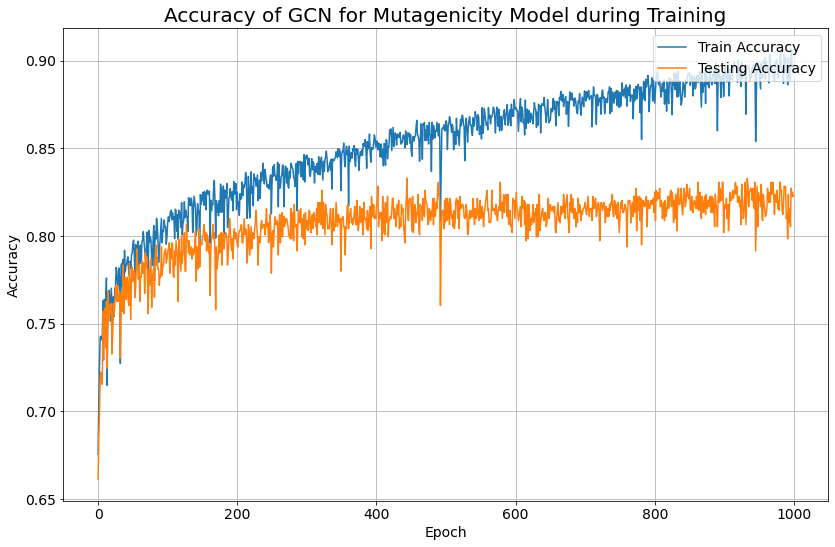

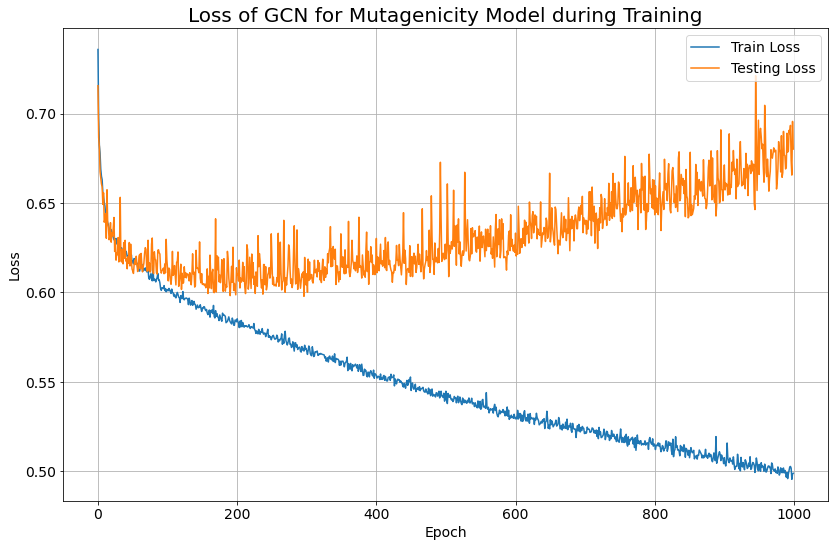

Number of cenroids: 30
Cluster sizes by cluster id:
	Cluster 0: 1366
	Cluster 1: 403
	Cluster 2: 812
	Cluster 3: 191
	Cluster 4: 1
	Cluster 5: 5
	Cluster 6: 12
	Cluster 7: 414
	Cluster 8: 151
	Cluster 9: 651
	Cluster 10: 387
	Cluster 11: 1754
	Cluster 12: 160
	Cluster 13: 48
	Cluster 14: 246
	Cluster 15: 47
	Cluster 16: 120
	Cluster 17: 173
	Cluster 18: 14
	Cluster 19: 137
	Cluster 20: 17
	Cluster 21: 2652
	Cluster 22: 984
	Cluster 23: 698
	Cluster 24: 295
	Cluster 25: 456
	Cluster 26: 343
	Cluster 27: 101
	Cluster 28: 342
	Cluster 29: 6
Concept homogeneity score: 0.12673336918045924
Concept completeness score: 0.03175237060693838
Nodes to visualise  torch.Size([12986])


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

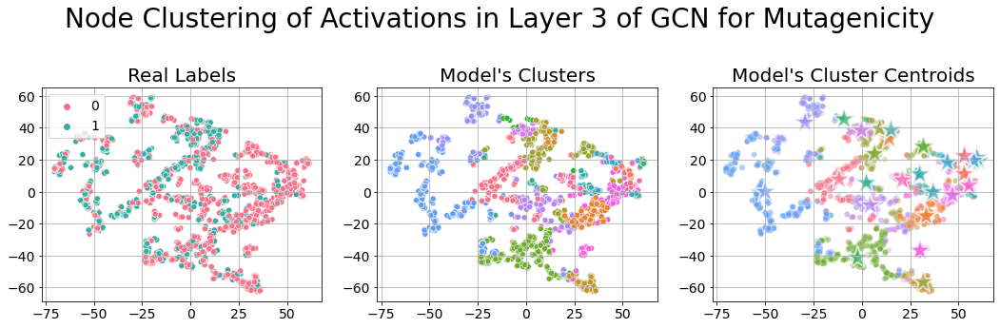

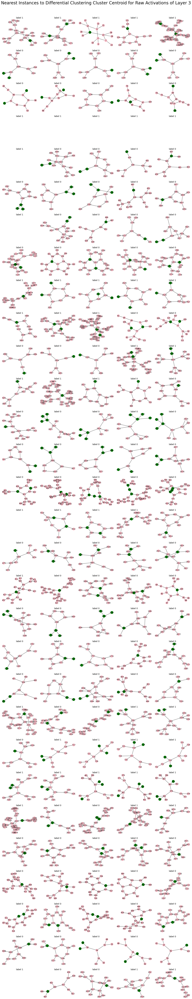

Global seed set to 19



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------


Dataset: Mutagenicity(4337):
Number of graphs: 4337
Number of features: 14
Number of classes: 2

Class split - Training 0: 1945 1:1524, Test 0: 456 1: 412


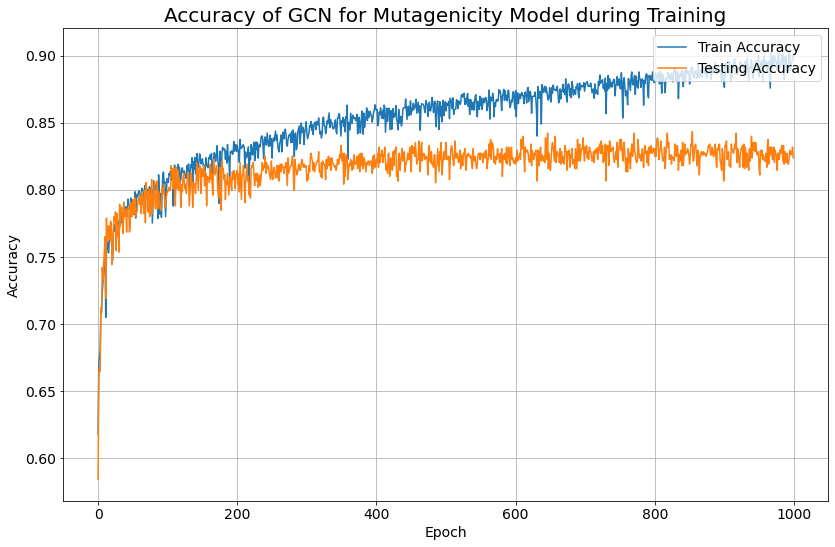

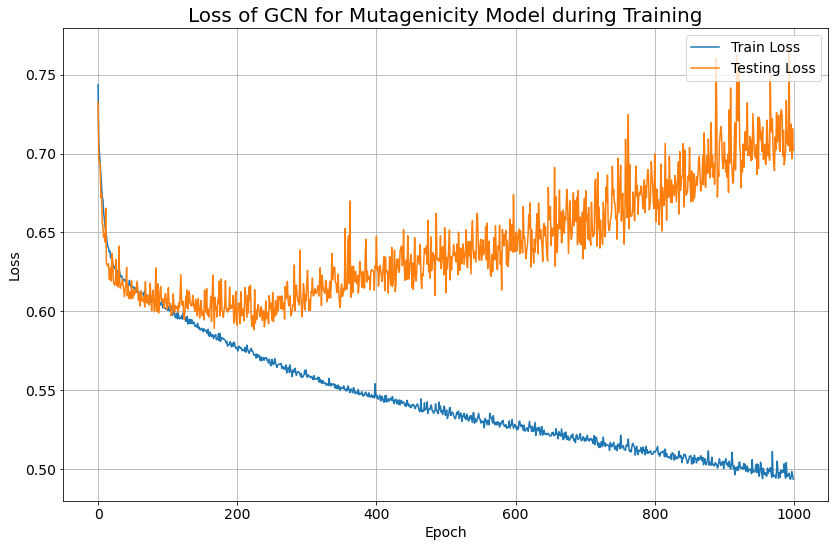

Number of cenroids: 30
Cluster sizes by cluster id:
	Cluster 0: 1854
	Cluster 1: 196
	Cluster 2: 507
	Cluster 3: 116
	Cluster 4: 357
	Cluster 5: 30
	Cluster 6: 264
	Cluster 7: 698
	Cluster 8: 51
	Cluster 9: 3026
	Cluster 10: 145
	Cluster 11: 106
	Cluster 12: 2
	Cluster 13: 258
	Cluster 14: 532
	Cluster 15: 217
	Cluster 16: 1694
	Cluster 17: 72
	Cluster 18: 1034
	Cluster 19: 217
	Cluster 20: 174
	Cluster 21: 499
	Cluster 22: 355
	Cluster 23: 51
	Cluster 24: 32
	Cluster 25: 206
	Cluster 26: 26
	Cluster 27: 169
	Cluster 28: 124
	Cluster 29: 6
Concept homogeneity score: 0.0664268091765398
Concept completeness score: 0.017365784362758256
Nodes to visualise  torch.Size([13018])


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

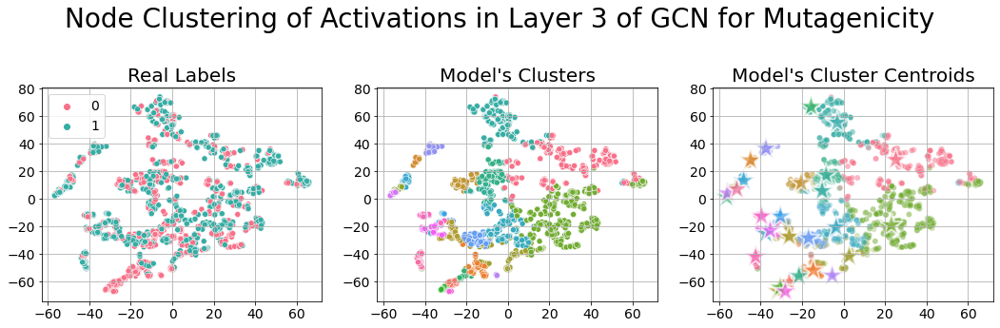

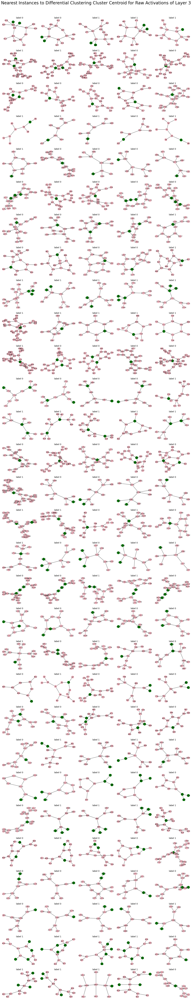

Global seed set to 76



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------


Dataset: Mutagenicity(4337):
Number of graphs: 4337
Number of features: 14
Number of classes: 2

Class split - Training 0: 1927 1:1542, Test 0: 474 1: 394


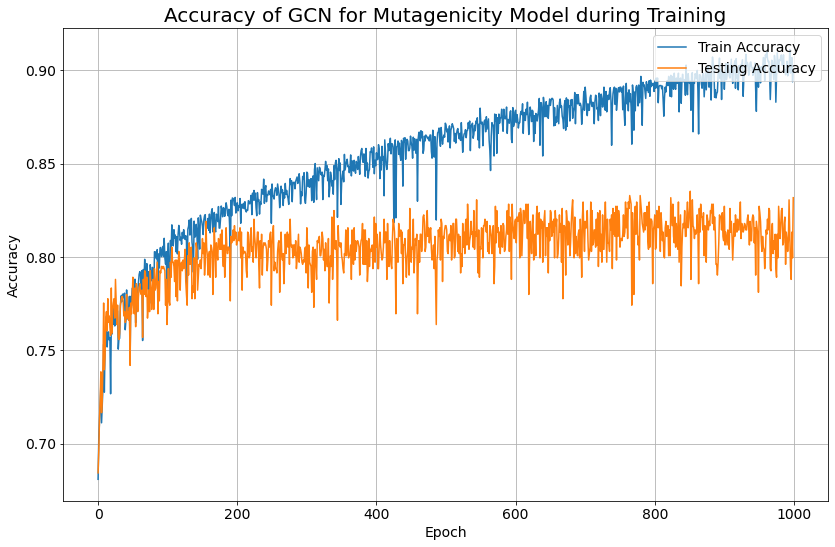

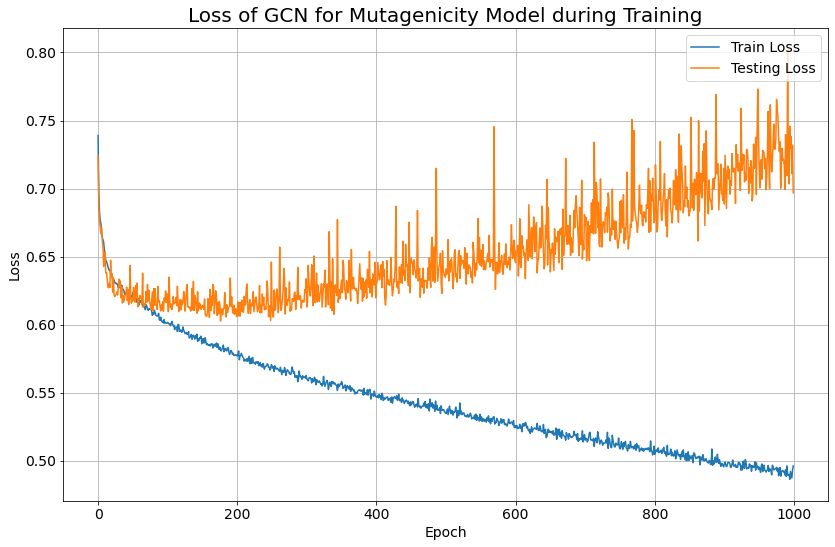

Number of cenroids: 30
Cluster sizes by cluster id:
	Cluster 0: 2221
	Cluster 1: 276
	Cluster 2: 1
	Cluster 3: 31
	Cluster 4: 411
	Cluster 5: 1576
	Cluster 6: 47
	Cluster 7: 2655
	Cluster 8: 32
	Cluster 9: 575
	Cluster 10: 56
	Cluster 11: 4
	Cluster 12: 136
	Cluster 13: 161
	Cluster 14: 186
	Cluster 15: 99
	Cluster 16: 700
	Cluster 17: 708
	Cluster 18: 41
	Cluster 19: 13
	Cluster 20: 1114
	Cluster 21: 311
	Cluster 22: 18
	Cluster 23: 692
	Cluster 24: 31
	Cluster 25: 304
	Cluster 26: 111
	Cluster 27: 482
	Cluster 28: 112
	Cluster 29: 460
Concept homogeneity score: 0.09887624137548028
Concept completeness score: 0.025891665406229145
Nodes to visualise  torch.Size([13564])


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

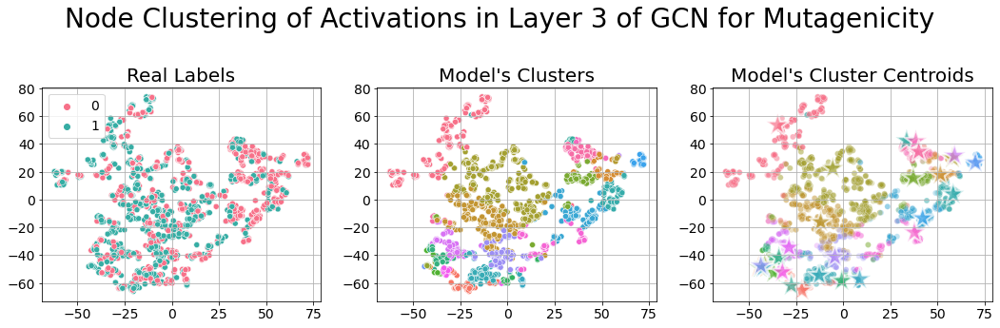

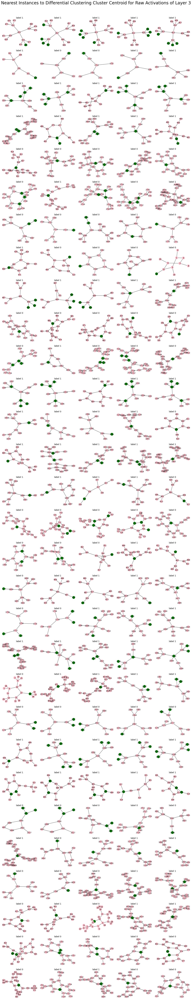

Global seed set to 58



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------


Dataset: Mutagenicity(4337):
Number of graphs: 4337
Number of features: 14
Number of classes: 2

Class split - Training 0: 1915 1:1554, Test 0: 486 1: 382


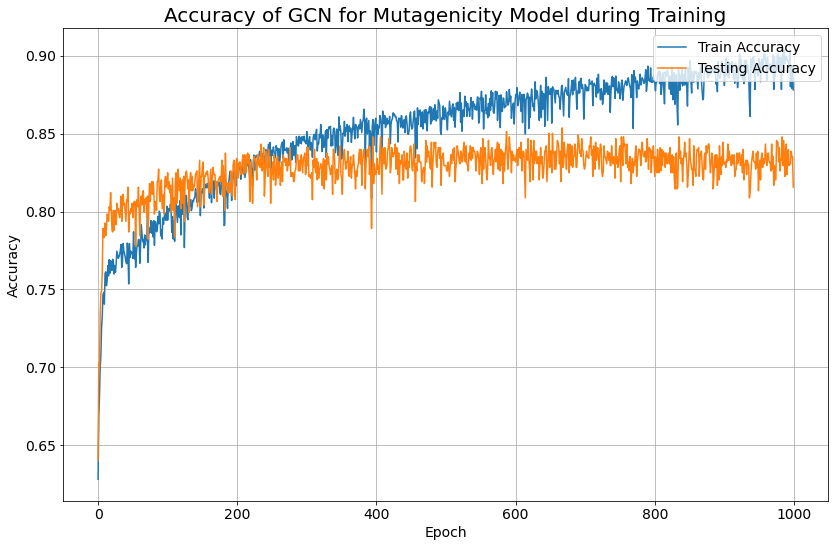

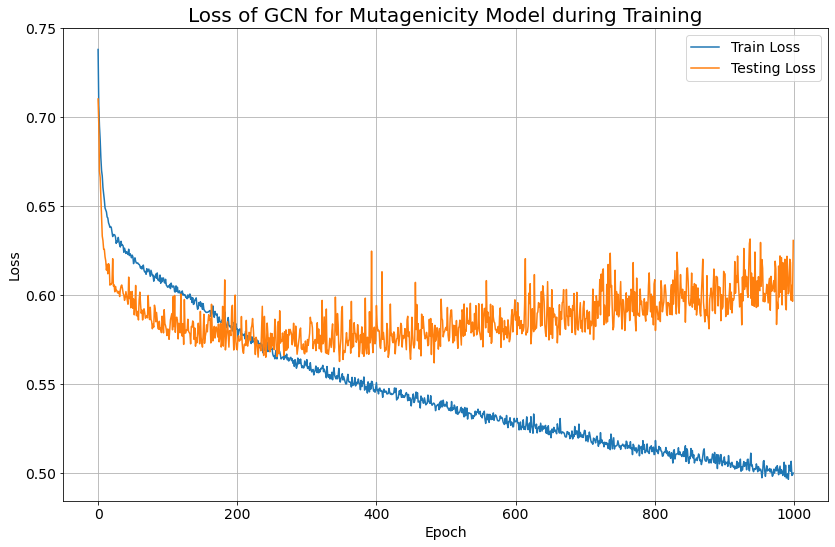

Number of cenroids: 30
Cluster sizes by cluster id:
	Cluster 0: 153
	Cluster 1: 969
	Cluster 2: 1066
	Cluster 3: 40
	Cluster 4: 145
	Cluster 5: 283
	Cluster 6: 430
	Cluster 7: 3
	Cluster 8: 407
	Cluster 9: 2232
	Cluster 10: 886
	Cluster 11: 320
	Cluster 12: 328
	Cluster 13: 191
	Cluster 14: 749
	Cluster 15: 380
	Cluster 16: 83
	Cluster 17: 146
	Cluster 18: 216
	Cluster 19: 252
	Cluster 20: 9
	Cluster 21: 300
	Cluster 22: 31
	Cluster 23: 292
	Cluster 24: 148
	Cluster 25: 585
	Cluster 26: 16
	Cluster 27: 281
	Cluster 28: 51
	Cluster 29: 1876
Concept homogeneity score: 0.09064177950268833
Concept completeness score: 0.02180620787022237
Nodes to visualise  torch.Size([12868])


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

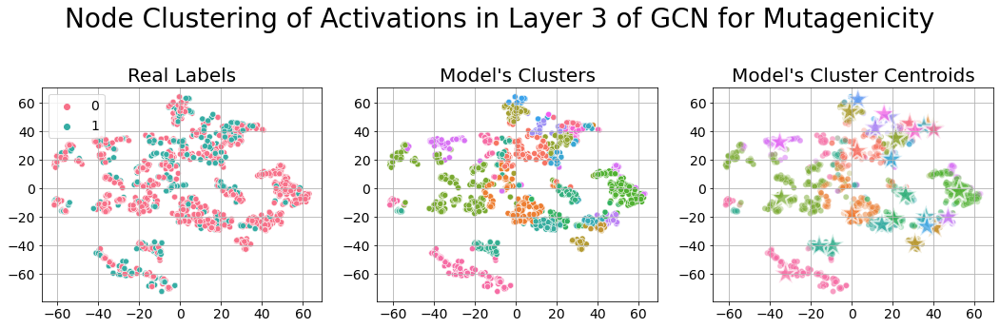

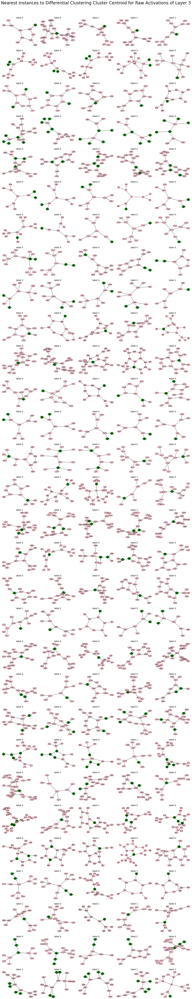

Global seed set to 92



END EXPERIMENT-------------------------------------------


START EXPERIMENT-----------------------------------------


Dataset: Mutagenicity(4337):
Number of graphs: 4337
Number of features: 14
Number of classes: 2

Class split - Training 0: 1931 1:1538, Test 0: 470 1: 398


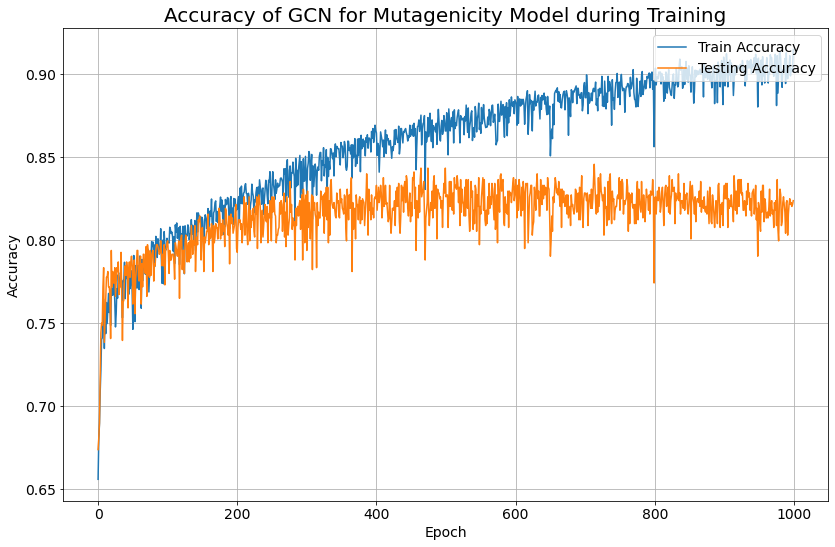

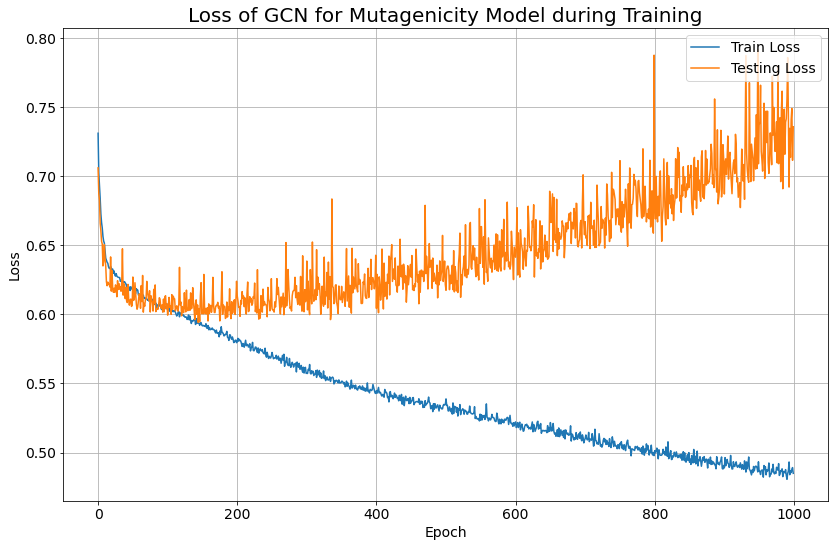

Number of cenroids: 30
Cluster sizes by cluster id:
	Cluster 0: 650
	Cluster 1: 73
	Cluster 2: 804
	Cluster 3: 74
	Cluster 4: 1068
	Cluster 5: 219
	Cluster 6: 1540
	Cluster 7: 441
	Cluster 8: 9
	Cluster 9: 48
	Cluster 10: 216
	Cluster 11: 60
	Cluster 12: 76
	Cluster 13: 191
	Cluster 14: 176
	Cluster 15: 172
	Cluster 16: 238
	Cluster 17: 20
	Cluster 18: 742
	Cluster 19: 1573
	Cluster 20: 243
	Cluster 21: 9
	Cluster 22: 430
	Cluster 23: 91
	Cluster 24: 88
	Cluster 25: 58
	Cluster 26: 241
	Cluster 27: 719
	Cluster 28: 2531
	Cluster 29: 308
Concept homogeneity score: 0.08515790132026144
Concept completeness score: 0.021352123659484364
Nodes to visualise  torch.Size([13108])


/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/luciecharlottemagister/Documents/Cambridge/PhD/Projects/NEWRON_LEN/newron_len_env/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword a

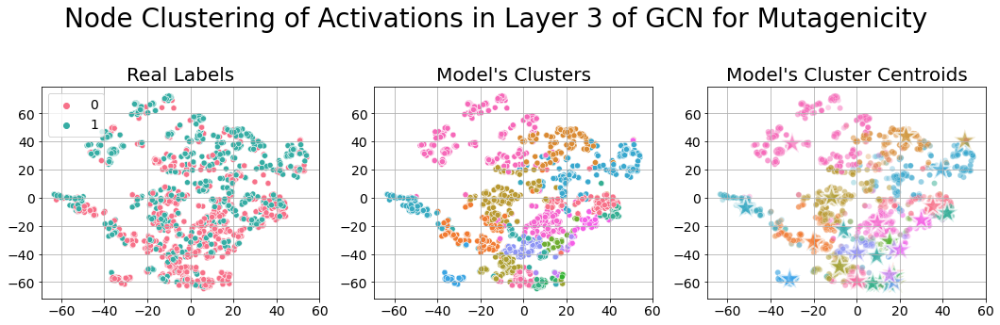

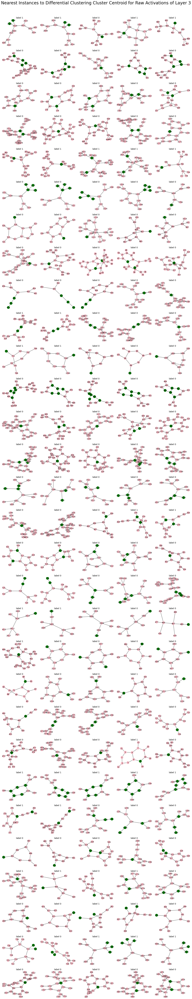


END EXPERIMENT-------------------------------------------



In [6]:
# run multiple times for confidence interval - seeds generated using Google's random number generator
random_seeds = [42, 19, 76, 58, 92]

for seed in random_seeds:
    print("\nSTART EXPERIMENT-----------------------------------------\n")
    seed_everything(seed)
    
    path = os.path.join("..", "..", "output", "Standard_" + DATASET_NAME, f"seed_{seed}")
    data_utils.create_path(path)

    run_experiment(seed, path, load_pretrained=False)
    
    print("\nEND EXPERIMENT-------------------------------------------\n")